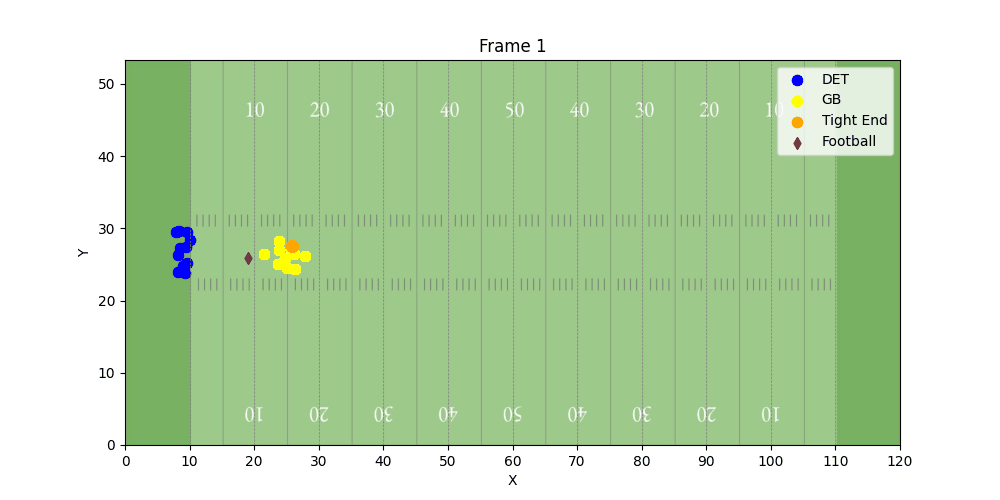

In [3]:
# Animation Visualizer
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imageio
import numpy as np
import pandas as pd
from scipy.spatial import distance
from IPython.display import display, Image
import warnings

warnings.filterwarnings("ignore") 

data = pd.read_excel("/Users/danielsoriano/Downloads/nfl-big-data-bowl-2025/data_2022110603_915 1.xlsx")
data

game_id = 2022110603
play_id = 915

offense = data[data['club'] == data[data['position'] == 'QB']['club'].iloc[0]]
defense = data[data['club'] == data[data['position'] == 'CB']['club'].iloc[0]]

background_img = mpimg.imread('/Users/danielsoriano/Downloads/nfl-big-data-bowl-2025/football_field.jpg')

target_positions = {'TE': 2}
gif_frames = []

for frame_id in sorted(data['frameId'].unique()):
    frame_data = data[data['frameId'] == frame_id]
    
    clubs = frame_data['club'].unique()
    clubs = [club for club in clubs if club != 'football'][:2]
    
    off_players_frame = frame_data[frame_data['club'] == clubs[0]]
    def_players = frame_data[frame_data['club'] == clubs[1]]
    
    off_targets = off_players_frame[off_players_frame['position'].isin(target_positions.keys())]
    off_target_data = []
    for position, count in target_positions.items():
        position_players = off_targets[off_targets['position'] == position]
        off_target_data.append(position_players.head(count))
    off_target_data = pd.concat(off_target_data)

    tightend_data = frame_data[frame_data['position'] == 'TE']

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.set_xlim(0, 120)
    ax.set_ylim(0, 53.3)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title(f'Frame {frame_id}')
    ax.imshow(background_img, extent=[0, 120, 0, 53.3], aspect='auto', alpha=0.9)
    ax.set_xticks(range(0, 121, 10))  
    ax.grid(color='gray', linestyle='--', linewidth=0.5, axis='x')  
    
    ax.scatter(def_players['x'], def_players['y'], color='blue', s=55, label=clubs[1])
    ax.scatter(off_players_frame['x'], off_players_frame['y'], color='yellow', s=55, label=clubs[0])
    ax.scatter(tightend_data['x'], tightend_data['y'], color='orange', s=55, label='Tight End')
    ax.scatter(frame_data[frame_data['club'] == 'football']['x'], 
               frame_data[frame_data['club'] == 'football']['y'], 
               color='brown', s=35, label='Football', marker='d')

    for _, off_player in off_target_data.iterrows():
        distances = def_players.apply(
            lambda def_player: distance.euclidean(
                (off_player['x'], off_player['y']),
                (def_player['x'], def_player['y'])
            ),
            axis=1
        )
        closest_def_index = distances.idxmin()
        closest_def_player = def_players.loc[closest_def_index]

        teammate_distances = off_players_frame[off_players_frame.index != off_player.name].apply(
            lambda teammate: distance.euclidean(
                (off_player['x'], off_player['y']),
                (teammate['x'], teammate['y'])
            ),
            axis=1
        )
        closest_teammate_index = teammate_distances.idxmin()
        closest_teammate = off_players_frame.loc[closest_teammate_index]

        ax.plot(
            [off_player['x'], closest_teammate['x']], 
            [off_player['y'], closest_teammate['y']], 
            color='purple', linewidth=2
        )

    ax.legend(loc='upper right')

    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    gif_frames.append(image)
    plt.close(fig)

gif_path = 'play_2022110603_915.gif'
imageio.mimsave(gif_path, gif_frames, duration=0.1)

display(Image(filename=gif_path))
